Links:

https://arxiv.org/pdf/1701.07875.pdf \\
https://arxiv.org/pdf/1704.00028.pdf

In [ ]:
!nvidia-smi

Wed Aug 24 15:03:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import tensorflow.keras as keras
import tensorflow as tf
import tensorflow.keras.layers as layers

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

BATCH_SIZE = 256
Z_DIM = 100
N_EPOCHS = 200
D_STEPS = 5
GP_WEIGHT = 10.0

def prepare_data(batch_size):
  (X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

  X_all = np.concatenate([X_train, X_test])

  X_all = X_all.astype(np.float32) / 255.0
  X_all = X_all.reshape(-1, 28, 28, 1) * 2. - 1.

  dataset = tf.data.Dataset.from_tensor_slices(X_all).shuffle(X_all.shape[0])
  dataset = dataset.batch(batch_size).prefetch(1)

  return dataset


dataset = prepare_data(BATCH_SIZE)
dataset

11501568/11490434 [==============================] - 0s 0us/step


<PrefetchDataset element_spec=TensorSpec(shape=(None, 28, 28, 1), dtype=tf.float32, name=None)>

In [ ]:
def make_generator_model():
  model = tf.keras.Sequential()
  model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())

  model.add(layers.Reshape((7, 7, 256)))
  assert model.output_shape == (None, 7, 7, 256)

  model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
  assert model.output_shape == (None, 7, 7, 128)
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())

  model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
  assert model.output_shape == (None, 14, 14, 64)
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())

  model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False,
                                   activation='tanh'))
  assert model.output_shape == (None, 28, 28, 1)

  return model

def make_noise(batch, z_dim):
  return tf.random.normal([batch, z_dim])

In [ ]:
def make_critic_model():
  model = tf.keras.Sequential()
  model.add(layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[28,28,1]))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))
  
  model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(0.3))

  model.add(layers.Flatten())
  model.add(layers.Dense(1))

  return model

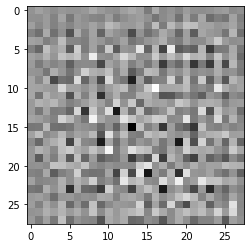

In [ ]:
generator = make_generator_model()
noise = make_noise(1, 100)

generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray_r');

In [ ]:
critic = make_critic_model()

pred = critic(generated_image)
print(pred)

tf.Tensor([[-0.00284611]], shape=(1, 1), dtype=float32)


In [ ]:
class WGAN(keras.Model):
  def __init__(self,
               discriminator,
               generator,
               latent_dim,
               discriminator_extra_steps=5,
               gp_weight=10.0):
    super().__init__()
    self.discriminator = discriminator
    self.generator = generator
    self.latent_dim = latent_dim
    self.d_steps = discriminator_extra_steps
    self.gp_weight = gp_weight

  def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
    super().compile()
    self.d_optimizer = d_optimizer
    self.g_optimizer = g_optimizer
    self.d_loss_fn = d_loss_fn
    self.g_loss_fn = g_loss_fn

  def gradient_penalty(self, batch_size, real_images, fake_images):
    # Get interpolated images
    alpha = tf.random.normal([batch_size,1,1,1], 0.0, 1.0)
    diff = fake_images - real_images
    interpolated = real_images + alpha * diff

    with tf.GradientTape() as gp_tape:
      gp_tape.watch(interpolated)

      # discriminator output for interpolated images
      pred = self.discriminator(interpolated, training=True)

    # Calculate gradients for interpolated images
    grads = gp_tape.gradient(pred, [interpolated])[0]
    # calculate the norm of the gradients
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]))
    gp = tf.reduce_mean((norm - 1.0)**2)

    return gp


  def train_step(self, real_images):
    if isinstance(real_images, tuple):
      real_images = real_images[0]

    batch_size = tf.shape(real_images)[0]


    # train critic n steps for 1 train step of the generator
    for i in range(self.d_steps):
      random_latent_vector = tf.random.normal(shape=(batch_size,
                                                     self.latent_dim))
      
      with tf.GradientTape() as tape:
        fake_images = self.generator(random_latent_vector, training=True)

        fake_logits = self.discriminator(fake_images, training=True)
        real_logits = self.discriminator(real_images, training=True)

        d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)

        gp = self.gradient_penalty(batch_size, real_images, fake_images)
        d_loss = d_cost + gp * self.gp_weight
      
      d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
      self.d_optimizer.apply_gradients(
          zip(d_gradient, self.discriminator.trainable_variables)
      )
    
    # train generator
    random_latent_vector = tf.random.normal(shape=(batch_size,
                                                     self.latent_dim))
    
    with tf.GradientTape() as tape:
      gen_images = self.generator(random_latent_vector, training=True)

      gen_img_logits = self.discriminator(gen_images, training=True)
      g_loss = self.g_loss_fn(gen_img_logits)

    gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
    self.g_optimizer.apply_gradients(
        zip(gen_gradient, self.generator.trainable_variables)
    )


    return {'d_loss': d_loss, 'g_loss': g_loss}


In [ ]:
def discriminator_loss(real_img, fake_img):
  real_loss = tf.reduce_mean(real_img)
  fake_loss = tf.reduce_mean(fake_img)
  return fake_loss - real_loss

def generator_loss(fake_img):
  return -tf.reduce_mean(fake_img)

In [ ]:
generator = make_generator_model()
discriminator = make_critic_model()
print('Generator summary:\n\n')
generator.summary()

Generator summary:


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 12544)             1254400   
                                                                 
 batch_normalization_3 (Batc  (None, 12544)            50176     
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 12544)             0         
                                                                 
 reshape_1 (Reshape)         (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 7, 7, 128)        819200    
 ranspose)                                                       
                                                                 
 batch_normalization_4 (Batc  (No

In [ ]:
print('Discriminator summary:\n\n')
discriminator.summary()

Discriminator summary:


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 14, 14, 64)        1664      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 dropout_2 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 7, 7, 128)         204928    
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_3 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten_1 (Flatten)         

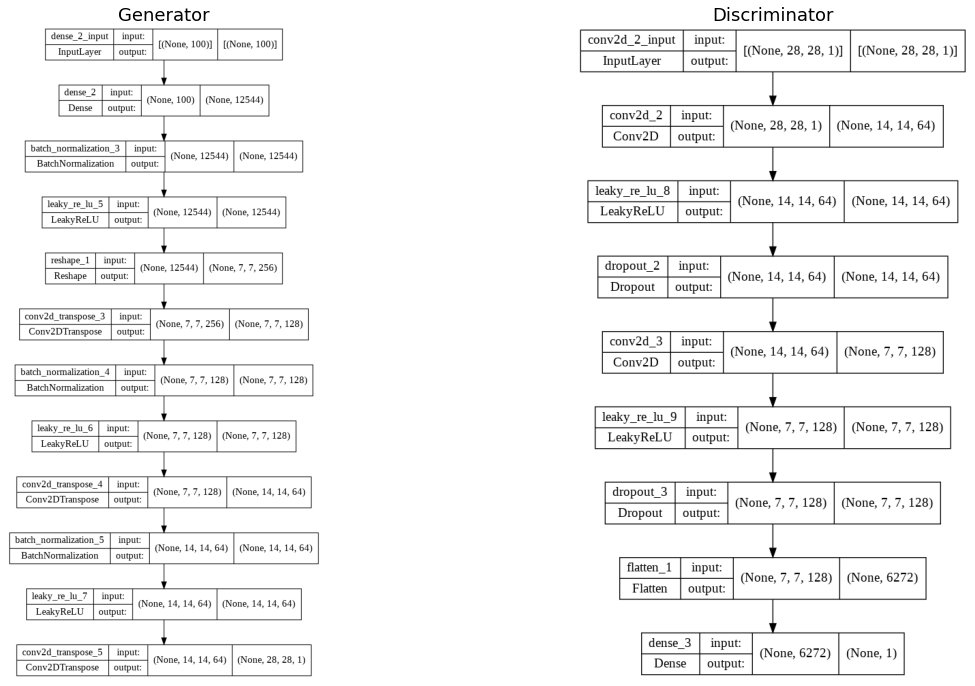

In [ ]:
keras.utils.plot_model(generator, show_shapes=True, expand_nested=True,
                       to_file='generator.png')
keras.utils.plot_model(discriminator, show_shapes=True, expand_nested=True, 
                       to_file='discriminator.png')

fig, ax = plt.subplots(1, 2, figsize=(20, 12))
ax[0].imshow(plt.imread('generator.png'))
ax[0].set_title('Generator', fontsize=18)
ax[1].imshow(plt.imread('discriminator.png'))
ax[1].set_title('Discriminator', fontsize=18)
ax[0].axis("off")
ax[1].axis("off")
plt.show()

In [ ]:
class PerformancePlotCallback(keras.callbacks.Callback):
  def __init__(self, model, seed):
    self.model = model
    self.seed = seed
        
  def on_epoch_end(self, epoch, logs={}):
    fake_images = self.model.generator(self.seed, training=False)

    fig = plt.figure(figsize=(4,4))

    for i in range (fake_images.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(fake_images[i, :, :, 0] * 127.5 + 127.5, cmap='gray_r')
      plt.axis(False)

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))

Epoch 1/200
274/274 [==============================] - 106s 358ms/step - d_loss: -8.2521 - g_loss: -18.2231
Epoch 2/200
274/274 [==============================] - 99s 361ms/step - d_loss: -3.1475 - g_loss: -16.4738
Epoch 3/200
274/274 [==============================] - 99s 362ms/step - d_loss: -2.4489 - g_loss: -13.9455
Epoch 4/200
274/274 [==============================] - 99s 361ms/step - d_loss: -2.3872 - g_loss: -13.7644
Epoch 5/200
274/274 [==============================] - 99s 361ms/step - d_loss: -2.3250 - g_loss: -14.7638
Epoch 6/200
274/274 [==============================] - 99s 362ms/step - d_loss: -2.2139 - g_loss: -15.2113
Epoch 7/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.9694 - g_loss: -15.2317
Epoch 8/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.9107 - g_loss: -13.2747
Epoch 9/200
274/274 [==============================] - 100s 363ms/step - d_loss: -1.7420 - g_loss: -14.8155
Epoch 10/200
274/274 [=============

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


274/274 [==============================] - 99s 362ms/step - d_loss: -1.1942 - g_loss: -10.0698
Epoch 21/200
274/274 [==============================] - 99s 361ms/step - d_loss: -1.1345 - g_loss: -7.4639
Epoch 22/200
274/274 [==============================] - 99s 361ms/step - d_loss: -1.1259 - g_loss: -7.5582
Epoch 23/200
274/274 [==============================] - 99s 361ms/step - d_loss: -1.1522 - g_loss: -7.8942
Epoch 24/200
274/274 [==============================] - 99s 363ms/step - d_loss: -1.0948 - g_loss: -8.8836
Epoch 25/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.1281 - g_loss: -8.4333
Epoch 26/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.0757 - g_loss: -6.6345
Epoch 27/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.0469 - g_loss: -6.6820
Epoch 28/200
274/274 [==============================] - 99s 362ms/step - d_loss: -1.0198 - g_loss: -6.7430
Epoch 29/200
274/274 [===========================

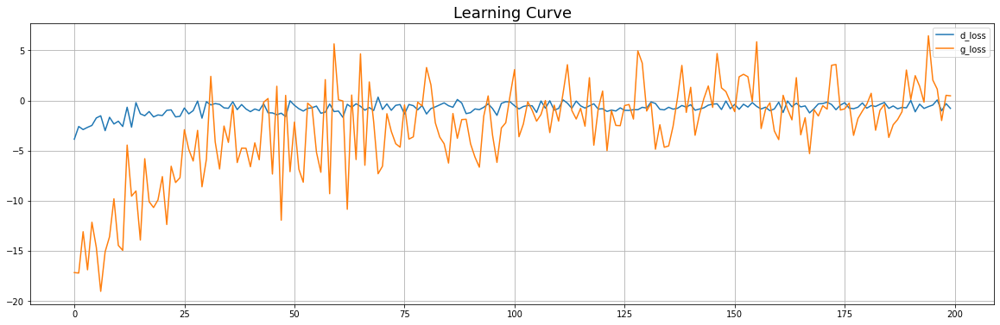

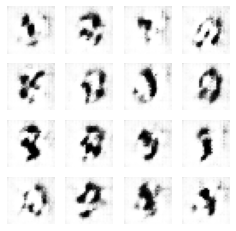

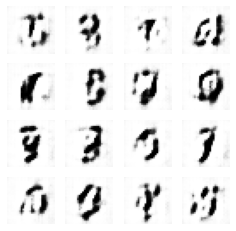

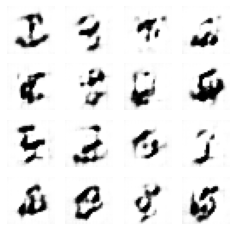

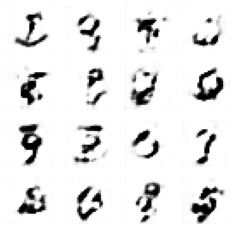

...

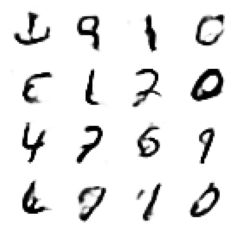

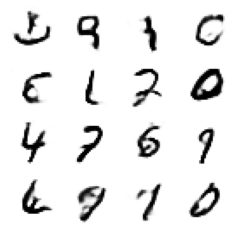

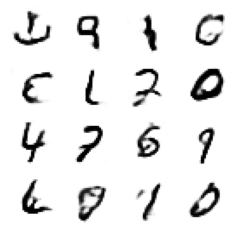

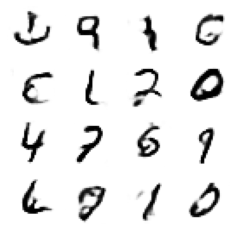

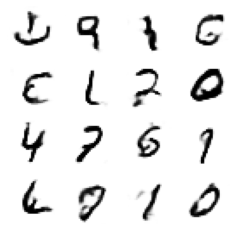

In [ ]:
generator = make_generator_model()
discriminator = make_critic_model()

seed = tf.random.normal([16, Z_DIM])
performance = PerformancePlotCallback(generator, seed)

dataset = prepare_data(BATCH_SIZE)

gan = WGAN(discriminator=discriminator, generator=generator,
           latent_dim=Z_DIM, discriminator_extra_steps=D_STEPS,
           gp_weight=GP_WEIGHT)

gan.compile(d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
            g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
            d_loss_fn=discriminator_loss,
            g_loss_fn=generator_loss)

fig, ax = plt.subplots(figsize=(20,6))
ax.set_title('Learning Curve', fontsize=18)

history = gan.fit(dataset, epochs=N_EPOCHS, verbose=1,
                  callbacks=[performance])
pd.DataFrame(history.history).plot(ax=ax)

ax.grid()

generator.save('MNIST-WGAN-GP2.h5')

### Generated Images

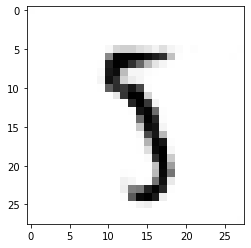

In [ ]:
noise = make_noise(1, 100)

generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray_r');

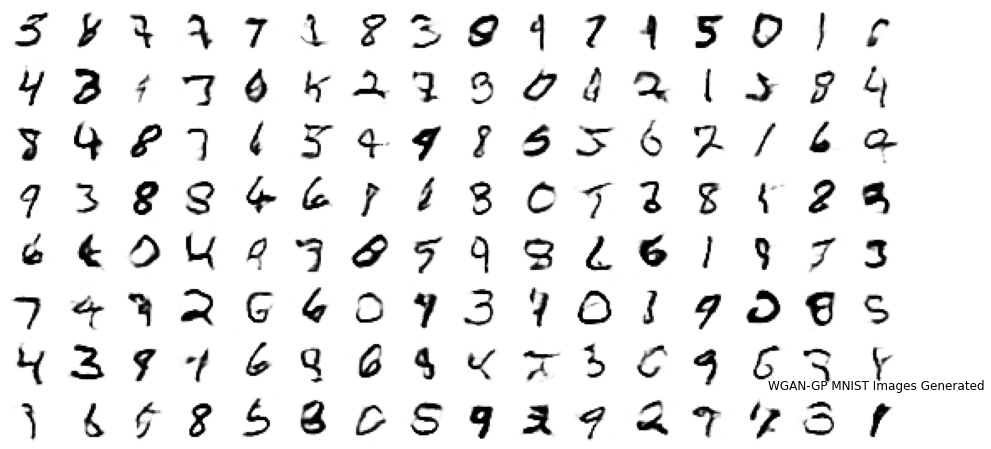

<Figure size 432x288 with 0 Axes>

In [ ]:
def plot_results(images, n_cols=None, title=None):
  n_cols = n_cols or len(images)
  n_rows = (len(images) - 1) // n_cols + 1

  if images.shape[-1] == 1:
    images = np.squeeze(images, axis=-1)

  fig = plt.figure(figsize=(n_cols, n_rows))

  for index, image in enumerate(images):
    plt.subplot(n_rows, n_cols, index+1)
    plt.imshow(image, cmap='binary')
    plt.axis('off')

  plt.title(title)


generator = keras.models.load_model('MNIST-WGAN-GP2.h5')
fake_images = generator(tf.random.normal([128, Z_DIM]))

plot_results(fake_images, 16, 'WGAN-GP MNIST Images Generated')
plt.show()
plt.savefig('wgan-gp_mnist_images_generated.png')

**FID**

In [ ]:
from scipy.linalg import sqrtm

def frechet_distance(act1, act2):
  mu1, sigma1 = np.mean(act1, axis=0), np.cov(act1, rowvar=False)
  mu2, sigma2 = np.mean(act2, axis=0), np.cov(act2, rowvar=False)

  ssdiff = np.sum((mu1 - mu2)**2.0)
  covmean = sqrtm(sigma1.dot(sigma2))

  if np.iscomplexobj(covmean):
    covmean = covmean.real

  fid = ssdiff + np.trace(sigma1 + sigma2 -2.0 * covmean)

  return fid

def prepare_images():
  (X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

  X_all = np.concatenate([X_train, X_test])

  X_train = X_train.astype(np.float32) / 255.0
  X_train = X_train.reshape(-1, 28, 28, 1) * 2. - 1.

  return X_train[:1024, :, :, :]

evaluator = keras.models.Sequential(keras.models.load_model('/content/mnist_net.h5').layers[:-1])

generator = make_generator_model()
generator = keras.models.load_model('MNIST-WGAN-GP2.h5')

fake_images = generator(tf.random.normal([1024, Z_DIM]))

embeddings_real = evaluator(prepare_images())
embeddings_fake = evaluator(fake_images)

fid_wgan = frechet_distance(embeddings_real, embeddings_fake) 

In [ ]:
fid_wgan

74.52525537952297

**Create gif**

In [ ]:
import imageio
import glob

anim_file = 'wgan-gp2.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)

  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)

  image = imageio.imread(filename)
  writer.append_data(image)

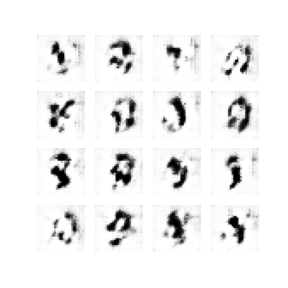

In [ ]:
from IPython.display import Image
Image(open('wgan-gp2.gif','rb').read())